## Import libraries ==> Load data ==> plot data ==> Analyze data ==> Build Models ==> Conclude conclusion

In [2]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt 
from sklearn.preprocessing import Imputer
from sklearn.cluster import KMeans
from scipy.stats import zscore
from sklearn.decomposition import PCA
from sklearn.tree import DecisionTreeClassifier
from sklearn import metrics
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from mlxtend.plotting import plot_decision_regions
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, classification_report, confusion_matrix
import time
from matplotlib.ticker import FormatStrFormatter
from mpl_toolkits.mplot3d import Axes3D
from sklearn import model_selection
import os
%matplotlib inline
my_random_seed=10
tic = time.process_time
vehicle =pd.read_csv('C:\\vehicle.csv')

## "vehicle" is the dataset which contains features extracted from the silhouette of vehicles in different angles 
## ==> 19 Features 846 records
## ==> CLASS is the only OBJECT (dependent) feature
## ==> All INDEPENDENT features are geometric features extracted from the silhouette hence are NUMERIC 


In [3]:
vehicle.head()

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
0,95,48.0,83.0,178.0,72.0,10,162.0,42.0,20.0,159,176.0,379.0,184.0,70.0,6.0,16.0,187.0,197,van
1,91,41.0,84.0,141.0,57.0,9,149.0,45.0,19.0,143,170.0,330.0,158.0,72.0,9.0,14.0,189.0,199,van
2,104,50.0,106.0,209.0,66.0,10,207.0,32.0,23.0,158,223.0,635.0,220.0,73.0,14.0,9.0,188.0,196,car
3,93,41.0,82.0,159.0,63.0,9,144.0,46.0,19.0,143,160.0,309.0,127.0,63.0,6.0,10.0,199.0,207,van
4,85,44.0,70.0,205.0,103.0,52,149.0,45.0,19.0,144,241.0,325.0,188.0,127.0,9.0,11.0,180.0,183,bus


In [4]:
vehicle.shape

(846, 19)

In [5]:
vehicle.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 846 entries, 0 to 845
Data columns (total 19 columns):
compactness                    846 non-null int64
circularity                    841 non-null float64
distance_circularity           842 non-null float64
radius_ratio                   840 non-null float64
pr.axis_aspect_ratio           844 non-null float64
max.length_aspect_ratio        846 non-null int64
scatter_ratio                  845 non-null float64
elongatedness                  845 non-null float64
pr.axis_rectangularity         843 non-null float64
max.length_rectangularity      846 non-null int64
scaled_variance                843 non-null float64
scaled_variance.1              844 non-null float64
scaled_radius_of_gyration      844 non-null float64
scaled_radius_of_gyration.1    842 non-null float64
skewness_about                 840 non-null float64
skewness_about.1               845 non-null float64
skewness_about.2               845 non-null float64
hollows_ratio    

## NULL values exists in numeric/independent features

In [6]:
vehicle.describe().T

,count,mean,std,min,25%,50%,75%,max
compactness,846.0,93.678487,8.234474,73.0,87.00,93.0,100.0,119.0
circularity,841.0,44.828775,6.152172,33.0,40.00,44.0,49.0,59.0
distance_circularity,842.0,82.110451,15.778292,40.0,70.00,80.0,98.0,112.0
radius_ratio,840.0,168.888095,33.520198,104.0,141.00,167.0,195.0,333.0
pr.axis_aspect_ratio,844.0,61.678910,7.891463,47.0,57.00,61.0,65.0,138.0
max.length_aspect_ratio,846.0,8.567376,4.601217,2.0,7.00,8.0,10.0,55.0
scatter_ratio,845.0,168.901775,33.214848,112.0,147.00,157.0,198.0,265.0
elongatedness,845.0,40.933728,7.816186,26.0,33.00,43.0,46.0,61.0
pr.axis_rectangularity,843.0,20.582444,2.592933,17.0,19.00,20.0,23.0,29.0
max.length_rectangularity,846.0,147.998818,14.515652,118.0,137.00,146.0,159.0,188.0


In [7]:
vehicle.isnull().values.any()

True

## X ==> new subset of "vehicle" with only INDEPENDET features
## X ==> NaN / NULL values are replaced with MEDIAN values
## y ==> new subset of "vehicle" with only DEPENDENT feature CLASS


In [8]:
X = vehicle.drop(columns=['class'])
y = vehicle['class']
X = X.apply(lambda x: x.fillna(x.median()),axis=0)
print(X.shape)
print(y.shape)
print(X.columns)
print(vehicle.shape)

(846, 18)
(846,)
Index(['compactness', 'circularity', 'distance_circularity', 'radius_ratio',
       'pr.axis_aspect_ratio', 'max.length_aspect_ratio', 'scatter_ratio',
       'elongatedness', 'pr.axis_rectangularity', 'max.length_rectangularity',
       'scaled_variance', 'scaled_variance.1', 'scaled_radius_of_gyration',
       'scaled_radius_of_gyration.1', 'skewness_about', 'skewness_about.1',
       'skewness_about.2', 'hollows_ratio'],
      dtype='object')
(846, 19)


In [9]:
X.isnull().values.any()

False

## ZX ==> SCALED version on X 
## ZX  ==> SCALED using ZSCORE

In [10]:
ZX = X.apply(zscore)
ZX.head()

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio
0,0.160580,0.518073,0.057177,0.273363,1.310398,0.311542,-0.207598,0.136262,-0.224342,0.758332,-0.401920,-0.341934,0.285705,-0.327326,-0.073812,0.380870,-0.312012,0.183957
1,-0.325470,-0.623732,0.120741,-0.835032,-0.593753,0.094079,-0.599423,0.520519,-0.610886,-0.344578,-0.593357,-0.619724,-0.513630,-0.059384,0.538390,0.156798,0.013265,0.452977
2,1.254193,0.844303,1.519141,1.202018,0.548738,0.311542,1.148719,-1.144597,0.935290,0.689401,1.097671,1.109379,1.392477,0.074587,1.558727,-0.403383,-0.149374,0.049447
3,-0.082445,-0.623732,-0.006386,-0.295813,0.167907,0.094079,-0.750125,0.648605,-0.610886,-0.344578,-0.912419,-0.738777,-1.466683,-1.265121,-0.073812,-0.291347,1.639649,1.529056
4,-1.054545,-0.134387,-0.769150,1.082192,5.245643,9.444962,-0.599423,0.520519,-0.610886,-0.275646,1.671982,-0.648070,0.408680,7.309005,0.538390,-0.179311,-1.450481,-1.699181


In [11]:
X.head()

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio
0,95,48.0,83.0,178.0,72.0,10,162.0,42.0,20.0,159,176.0,379.0,184.0,70.0,6.0,16.0,187.0,197
1,91,41.0,84.0,141.0,57.0,9,149.0,45.0,19.0,143,170.0,330.0,158.0,72.0,9.0,14.0,189.0,199
2,104,50.0,106.0,209.0,66.0,10,207.0,32.0,23.0,158,223.0,635.0,220.0,73.0,14.0,9.0,188.0,196
3,93,41.0,82.0,159.0,63.0,9,144.0,46.0,19.0,143,160.0,309.0,127.0,63.0,6.0,10.0,199.0,207
4,85,44.0,70.0,205.0,103.0,52,149.0,45.0,19.0,144,241.0,325.0,188.0,127.0,9.0,11.0,180.0,183


## X & ZX have altogther difference statistics values now

In [12]:
X.describe().T

,count,mean,std,min,25%,50%,75%,max
compactness,846.0,93.678487,8.234474,73.0,87.00,93.0,100.00,119.0
circularity,846.0,44.823877,6.134272,33.0,40.00,44.0,49.00,59.0
distance_circularity,846.0,82.100473,15.741569,40.0,70.00,80.0,98.00,112.0
radius_ratio,846.0,168.874704,33.401356,104.0,141.00,167.0,195.00,333.0
pr.axis_aspect_ratio,846.0,61.677305,7.882188,47.0,57.00,61.0,65.00,138.0
max.length_aspect_ratio,846.0,8.567376,4.601217,2.0,7.00,8.0,10.00,55.0
scatter_ratio,846.0,168.887707,33.197710,112.0,147.00,157.0,198.00,265.0
elongatedness,846.0,40.936170,7.811882,26.0,33.00,43.0,46.00,61.0
pr.axis_rectangularity,846.0,20.580378,2.588558,17.0,19.00,20.0,23.00,29.0
max.length_rectangularity,846.0,147.998818,14.515652,118.0,137.00,146.0,159.00,188.0


In [13]:
ZX.describe().T

,count,mean,std,min,25%,50%,75%,max
compactness,846.0,5.572112e-16,1.000592,-2.512695,-0.811520,-0.082445,0.768143,3.076880
circularity,846.0,-1.018361e-16,1.000592,-1.928651,-0.786846,-0.134387,0.681188,2.312338
distance_circularity,846.0,2.370051e-16,1.000592,-2.676060,-0.769150,-0.133514,1.010632,1.900523
radius_ratio,846.0,8.871286e-17,1.000592,-1.943427,-0.835032,-0.056160,0.782625,4.916638
pr.axis_aspect_ratio,846.0,3.732239e-16,1.000592,-1.863187,-0.593753,-0.085979,0.421794,9.688661
max.length_aspect_ratio,846.0,-2.036721e-16,1.000592,-1.428157,-0.340845,-0.123383,0.311542,10.097349
scatter_ratio,846.0,-4.391024e-16,1.000592,-1.714617,-0.659704,-0.358300,0.877456,2.896861
elongatedness,846.0,-8.582575e-17,1.000592,-1.913112,-1.016511,0.264347,0.648605,2.569893
pr.axis_rectangularity,846.0,-4.320159e-16,1.000592,-1.383974,-0.610886,-0.224342,0.935290,3.254554
max.length_rectangularity,846.0,7.968409e-16,1.000592,-2.067876,-0.758169,-0.137782,0.758332,2.757358


## vehicle.class & y.unique have same unique values : VAN , CAR, BUS

In [14]:
vehicle['class'].unique()

array(['van', 'car', 'bus'], dtype=object)

In [15]:
y.unique()

array(['van', 'car', 'bus'], dtype=object)

## X & ZX boxplots
### X   ==> Outliers are reported
### ZX ==> Outliers are crystal clear reported 
#### After seeing the max values of above outliers columns, it's looks like outliers in above columns are natural not a typo mistake or artificial. Note: It's my assumption only. as there is no way to prove whether these outliers are natural or artificial. 

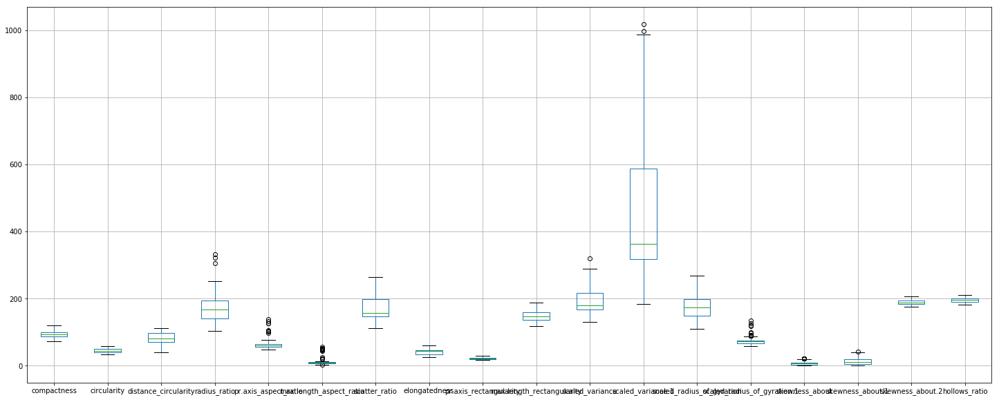

In [16]:
X.boxplot(figsize=(25,10))

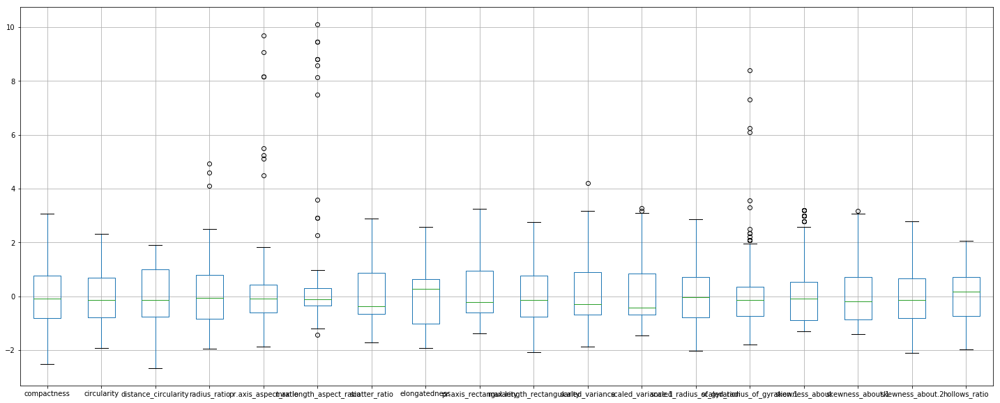

In [17]:
ZX.boxplot(figsize=(25,10))

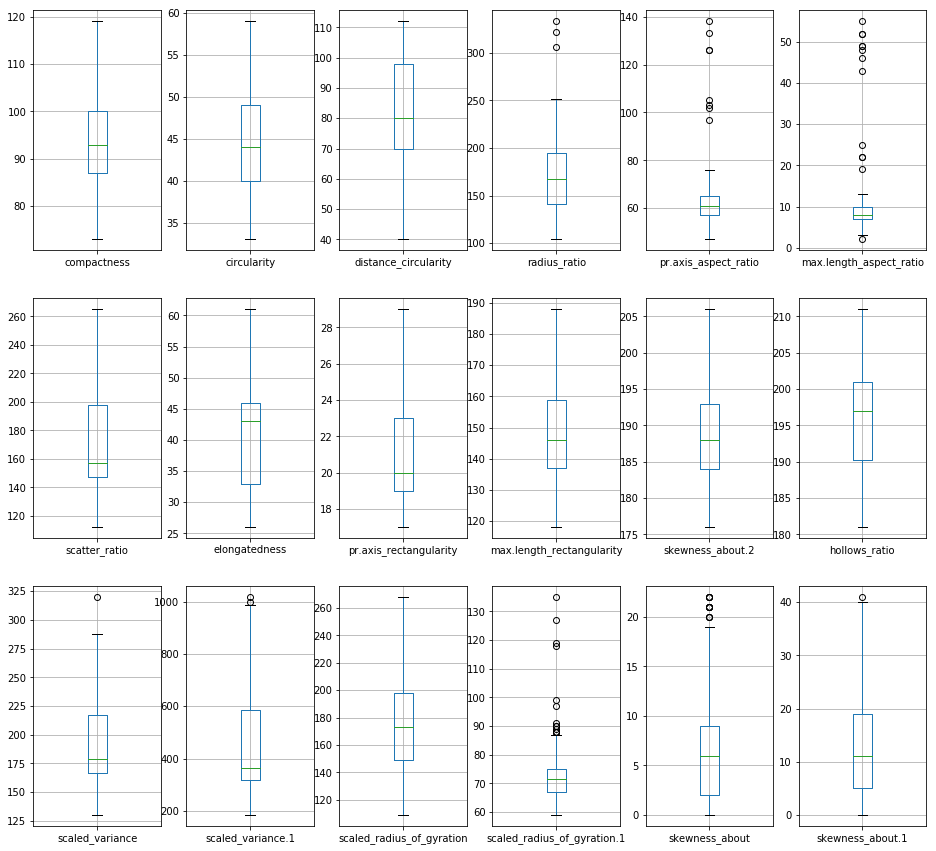

In [18]:
fig, axes = plt.subplots(3,6, figsize = (16,15))
X.boxplot(column='compactness', return_type='axes',ax=axes[0,0])
X.boxplot(column='circularity', return_type='axes',ax=axes[0,1])
X.boxplot(column='distance_circularity', return_type='axes',ax=axes[0,2])
X.boxplot(column='radius_ratio', return_type='axes',ax=axes[0,3])
X.boxplot(column='pr.axis_aspect_ratio', return_type='axes',ax=axes[0,4])
X.boxplot(column='max.length_aspect_ratio', return_type='axes',ax=axes[0,5])

X.boxplot(column='scatter_ratio', return_type='axes',ax=axes[1,0])
X.boxplot(column='elongatedness', return_type='axes',ax=axes[1,1])
X.boxplot(column='pr.axis_rectangularity', return_type='axes',ax=axes[1,2])
X.boxplot(column='max.length_rectangularity', return_type='axes',ax=axes[1,3])
X.boxplot(column='skewness_about.2', return_type='axes',ax=axes[1,4])
X.boxplot(column='hollows_ratio', return_type='axes',ax=axes[1,5])

X.boxplot(column='scaled_variance', return_type='axes',ax=axes[2,0])
X.boxplot(column='scaled_variance.1', return_type='axes',ax=axes[2,1])
X.boxplot(column='scaled_radius_of_gyration', return_type='axes',ax=axes[2,2])
X.boxplot(column='scaled_radius_of_gyration.1', return_type='axes',ax=axes[2,3])
X.boxplot(column='skewness_about', return_type='axes',ax=axes[2,4])
X.boxplot(column='skewness_about.1', return_type='axes',ax=axes[2,5])

## CORRELATION matrix only captures directioonal relationhip between features. This is very much evident below. Hence ZX.corr() & X.corr() have same output & SCALING has no impact on corr() output

In [19]:
ZX.corr()

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio
compactness,1.000000,0.684887,0.789928,0.689743,0.091534,0.148249,0.812620,-0.788750,0.813694,0.676143,0.762070,0.814012,0.585243,-0.249593,0.236078,0.157015,0.298537,0.365552
circularity,0.684887,1.000000,0.792320,0.620912,0.153778,0.251467,0.847938,-0.821472,0.843400,0.961318,0.796306,0.835946,0.925816,0.051946,0.144198,-0.011439,-0.104426,0.046351
distance_circularity,0.789928,0.792320,1.000000,0.767035,0.158456,0.264686,0.905076,-0.911307,0.893025,0.774527,0.861519,0.886017,0.705771,-0.225944,0.113924,0.265547,0.146098,0.332732
radius_ratio,0.689743,0.620912,0.767035,1.000000,0.663447,0.450052,0.734429,-0.789481,0.708385,0.568949,0.793415,0.718436,0.536372,-0.180397,0.048713,0.173741,0.382214,0.471309
pr.axis_aspect_ratio,0.091534,0.153778,0.158456,0.663447,1.000000,0.648724,0.103732,-0.183035,0.079604,0.126909,0.272910,0.089189,0.121971,0.152950,-0.058371,-0.031976,0.239886,0.267725
max.length_aspect_ratio,0.148249,0.251467,0.264686,0.450052,0.648724,1.000000,0.166191,-0.180140,0.161502,0.305943,0.318957,0.143253,0.189743,0.295735,0.015599,0.043422,-0.026081,0.143919
scatter_ratio,0.812620,0.847938,0.905076,0.734429,0.103732,0.166191,1.000000,-0.971601,0.989751,0.809083,0.948662,0.993012,0.799875,-0.027542,0.074458,0.212428,0.005628,0.118817
elongatedness,-0.788750,-0.821472,-0.911307,-0.789481,-0.183035,-0.180140,-0.971601,1.000000,-0.948996,-0.775854,-0.936382,-0.953816,-0.766314,0.103302,-0.052600,-0.185053,-0.115126,-0.216905
pr.axis_rectangularity,0.813694,0.843400,0.893025,0.708385,0.079604,0.161502,0.989751,-0.948996,1.000000,0.810934,0.934227,0.988213,0.796690,-0.015495,0.083767,0.214700,-0.018649,0.099286
max.length_rectangularity,0.676143,0.961318,0.774527,0.568949,0.126909,0.305943,0.809083,-0.775854,0.810934,1.000000,0.744985,0.794615,0.866450,0.041622,0.135852,0.001366,-0.103948,0.076770


In [20]:
X.corr()

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio
compactness,1.000000,0.684887,0.789928,0.689743,0.091534,0.148249,0.812620,-0.788750,0.813694,0.676143,0.762070,0.814012,0.585243,-0.249593,0.236078,0.157015,0.298537,0.365552
circularity,0.684887,1.000000,0.792320,0.620912,0.153778,0.251467,0.847938,-0.821472,0.843400,0.961318,0.796306,0.835946,0.925816,0.051946,0.144198,-0.011439,-0.104426,0.046351
distance_circularity,0.789928,0.792320,1.000000,0.767035,0.158456,0.264686,0.905076,-0.911307,0.893025,0.774527,0.861519,0.886017,0.705771,-0.225944,0.113924,0.265547,0.146098,0.332732
radius_ratio,0.689743,0.620912,0.767035,1.000000,0.663447,0.450052,0.734429,-0.789481,0.708385,0.568949,0.793415,0.718436,0.536372,-0.180397,0.048713,0.173741,0.382214,0.471309
pr.axis_aspect_ratio,0.091534,0.153778,0.158456,0.663447,1.000000,0.648724,0.103732,-0.183035,0.079604,0.126909,0.272910,0.089189,0.121971,0.152950,-0.058371,-0.031976,0.239886,0.267725
max.length_aspect_ratio,0.148249,0.251467,0.264686,0.450052,0.648724,1.000000,0.166191,-0.180140,0.161502,0.305943,0.318957,0.143253,0.189743,0.295735,0.015599,0.043422,-0.026081,0.143919
scatter_ratio,0.812620,0.847938,0.905076,0.734429,0.103732,0.166191,1.000000,-0.971601,0.989751,0.809083,0.948662,0.993012,0.799875,-0.027542,0.074458,0.212428,0.005628,0.118817
elongatedness,-0.788750,-0.821472,-0.911307,-0.789481,-0.183035,-0.180140,-0.971601,1.000000,-0.948996,-0.775854,-0.936382,-0.953816,-0.766314,0.103302,-0.052600,-0.185053,-0.115126,-0.216905
pr.axis_rectangularity,0.813694,0.843400,0.893025,0.708385,0.079604,0.161502,0.989751,-0.948996,1.000000,0.810934,0.934227,0.988213,0.796690,-0.015495,0.083767,0.214700,-0.018649,0.099286
max.length_rectangularity,0.676143,0.961318,0.774527,0.568949,0.126909,0.305943,0.809083,-0.775854,0.810934,1.000000,0.744985,0.794615,0.866450,0.041622,0.135852,0.001366,-0.103948,0.076770


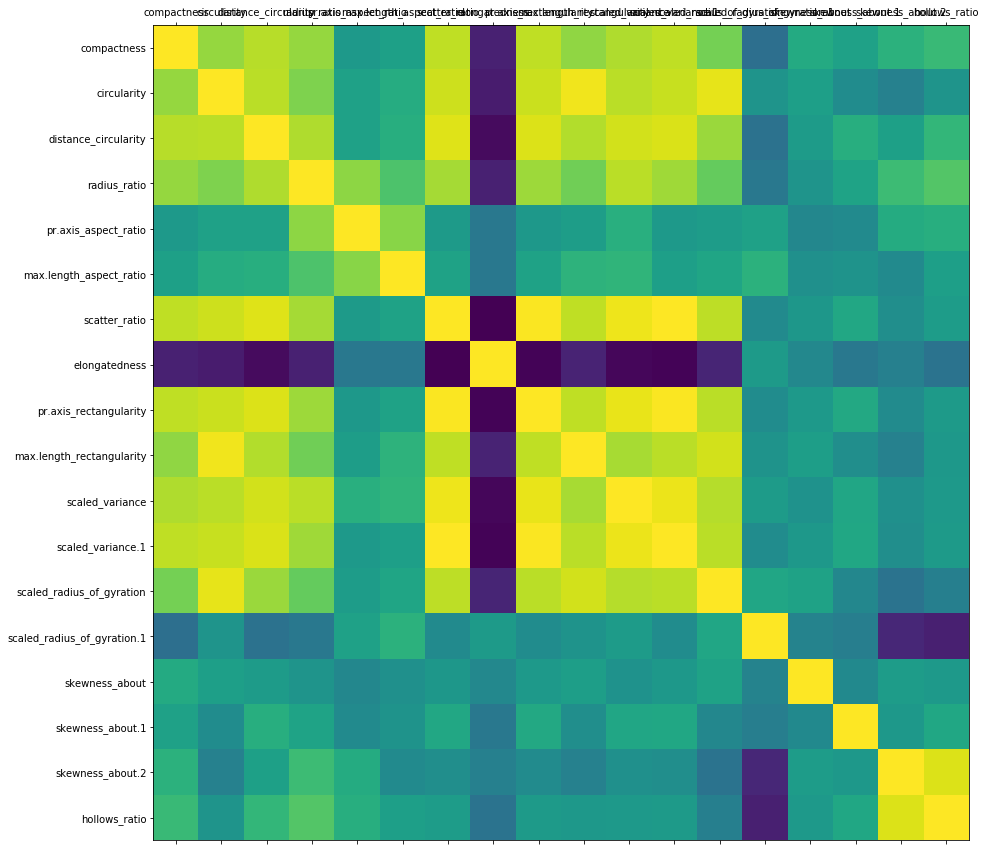

In [21]:
def plot_corr(df, size=15):
    corr = df.corr()
    fig, ax = plt.subplots(figsize=(size, size))
    ax.matshow(corr)
    plt.xticks(range(len(corr.columns)), corr.columns)
    plt.yticks(range(len(corr.columns)), corr.columns)
    
plot_corr(X)

## Pictorial display of corr()
## Linear & Cloud relationship between independent featured reported

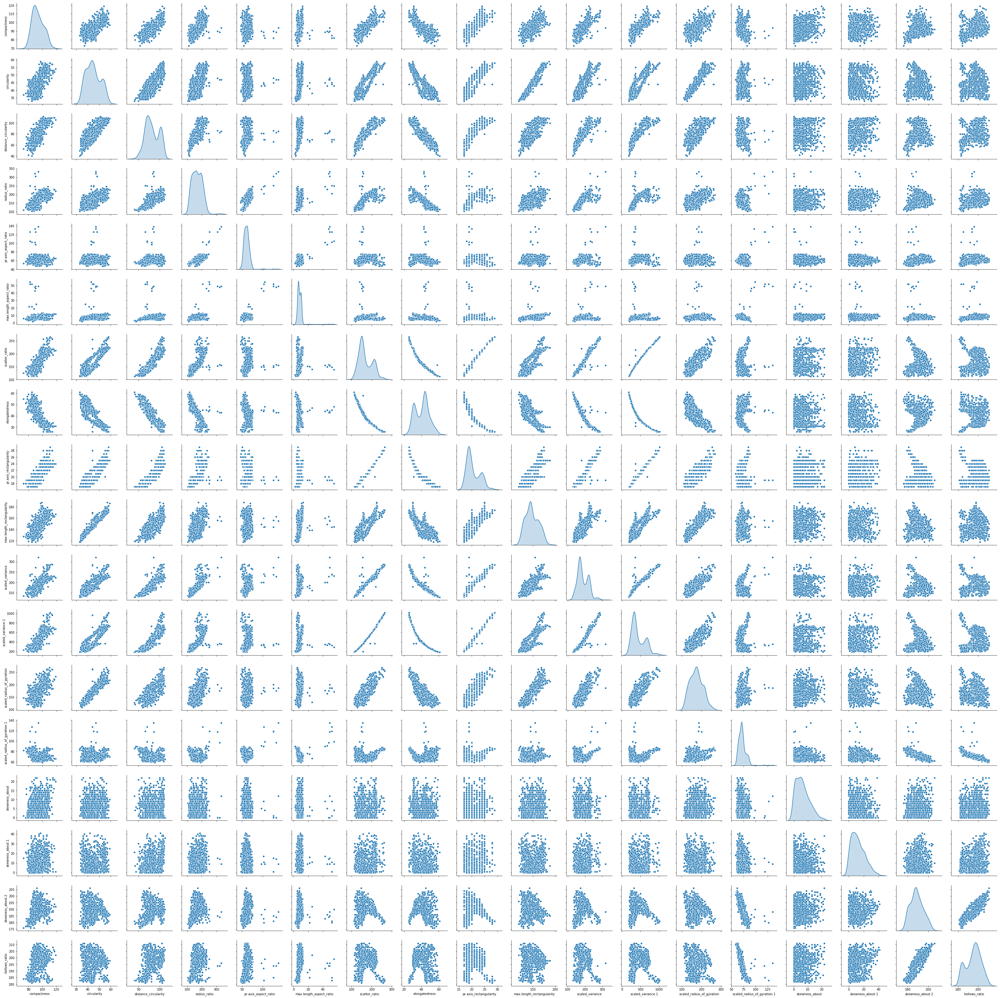

In [22]:
sns.pairplot(X,diag_kind='kde')

## Lets dig more into corr() figures. 
## 7 features have >~(-+).90 relationship

In [23]:
ZX.corr().unstack().sort_values() #.drop_duplicates()

scatter_ratio                elongatedness                 -0.971601
elongatedness                scatter_ratio                 -0.971601
                             scaled_variance.1             -0.953816
scaled_variance.1            elongatedness                 -0.953816
elongatedness                pr.axis_rectangularity        -0.948996
pr.axis_rectangularity       elongatedness                 -0.948996
scaled_variance              elongatedness                 -0.936382
elongatedness                scaled_variance               -0.936382
distance_circularity         elongatedness                 -0.911307
elongatedness                distance_circularity          -0.911307
                             circularity                   -0.821472
circularity                  elongatedness                 -0.821472
scaled_radius_of_gyration.1  hollows_ratio                 -0.802123
hollows_ratio                scaled_radius_of_gyration.1   -0.802123
elongatedness                radiu

## TO_DROP ==> subset of ZX where feature columns have correlation > 0.90
## Uncorr_ZX ==> Differnece of ZX & TO_DROP dataset 

In [24]:
# Create correlation matrix
corr_matrix = ZX.corr().abs()
# Select upper triangle of correlation matrix
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))
# Find index of feature columns with correlation greater than 0.90
to_drop = [column for column in upper.columns if any(upper[column] > 0.90)]
to_drop

['scatter_ratio',
 'elongatedness',
 'pr.axis_rectangularity',
 'max.length_rectangularity',
 'scaled_variance',
 'scaled_variance.1',
 'scaled_radius_of_gyration']

In [25]:
X.columns

Index(['compactness', 'circularity', 'distance_circularity', 'radius_ratio',
       'pr.axis_aspect_ratio', 'max.length_aspect_ratio', 'scatter_ratio',
       'elongatedness', 'pr.axis_rectangularity', 'max.length_rectangularity',
       'scaled_variance', 'scaled_variance.1', 'scaled_radius_of_gyration',
       'scaled_radius_of_gyration.1', 'skewness_about', 'skewness_about.1',
       'skewness_about.2', 'hollows_ratio'],
      dtype='object')

In [26]:
ZX.columns

Index(['compactness', 'circularity', 'distance_circularity', 'radius_ratio',
       'pr.axis_aspect_ratio', 'max.length_aspect_ratio', 'scatter_ratio',
       'elongatedness', 'pr.axis_rectangularity', 'max.length_rectangularity',
       'scaled_variance', 'scaled_variance.1', 'scaled_radius_of_gyration',
       'scaled_radius_of_gyration.1', 'skewness_about', 'skewness_about.1',
       'skewness_about.2', 'hollows_ratio'],
      dtype='object')

In [27]:
Uncorr_ZX = ZX.drop(columns=to_drop)
Uncorr_ZX.columns

Index(['compactness', 'circularity', 'distance_circularity', 'radius_ratio',
       'pr.axis_aspect_ratio', 'max.length_aspect_ratio',
       'scaled_radius_of_gyration.1', 'skewness_about', 'skewness_about.1',
       'skewness_about.2', 'hollows_ratio'],
      dtype='object')

In [28]:
print(X.shape)
print(ZX.shape)
print(Uncorr_ZX.shape)

(846, 18)
(846, 18)
(846, 11)


## TRAIN-TEST split on X, ZX & Uncorr_ZX datasets to calculate Feature Importance using Decision Tree Algorithim

In [29]:
X_train, X_test,y_train,y_test = train_test_split(X, y, test_size=.30, random_state=my_random_seed)
ZX_train, ZX_test,y_train,y_test = train_test_split(ZX, y, test_size=.30, random_state=my_random_seed)
Uncorr_ZX_train, Uncorr_ZX_test,y_train,y_test = train_test_split(Uncorr_ZX, y, test_size=.30, random_state=my_random_seed)

## Decision Tree has reported same Feature Importance output on ZX & X features 

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Decision Tree accuracy score 0.8622047244094488
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
                                  Imp
compactness                  0.070482
circularity                  0.000000
distance_circularity         0.047521
radius_ratio                 0.014009
pr.axis_aspect_ratio         0.033158
max.length_aspect_ratio      0.318394
scatter_ratio                0.000000
elongatedness                0.232675
pr.axis_rectangularity       0.000000
max.length_rectangularity    0.057661
scaled_variance              0.000000
scaled_variance.1            0.165911
scaled_radius_of_gyration    0.000000
scaled_radius_of_gyration.1  0.000000
skewness_about               0.041855
skewness_about.1             0.000000
skewness_about.2             0.000000
hollows_ratio                0.018332
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Decision Tree acc

<Figure size 1080x360 with 0 Axes>

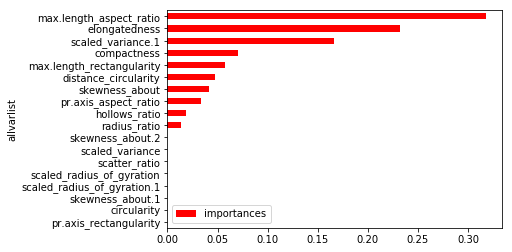

In [30]:
DT_model = DecisionTreeClassifier(criterion = 'entropy' , max_depth = 5, random_state=my_random_seed)
ZDT_model = DecisionTreeClassifier(criterion = 'entropy' , max_depth = 5, random_state=my_random_seed)
Uncorr_ZDT_model = DecisionTreeClassifier(criterion = 'entropy' , max_depth = 5, random_state=my_random_seed)


DT_model.fit(X_train,y_train)
ZDT_model.fit(ZX_train,y_train)
Uncorr_ZDT_model.fit(Uncorr_ZX_train,y_train)

print('++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++')
print('Decision Tree accuracy score',DT_model.score(X_test,y_test))
print('++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++')
print(pd.DataFrame(DT_model.feature_importances_, columns = ["Imp"], index = X_train.columns))
print('++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++')
print('Decision Tree accuracy score (SCALED)',ZDT_model.score(ZX_test,y_test))
print('++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++')
print(pd.DataFrame(ZDT_model.feature_importances_, columns = ["Imp"], index = ZX_train.columns))
print('++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++')
print('Decision Tree accuracy score (SCALED & Non-colienarity)',Uncorr_ZDT_model.score(Uncorr_ZX_test,y_test))
print('++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++')
print(pd.DataFrame(Uncorr_ZDT_model.feature_importances_, columns = ["Imp"], index = Uncorr_ZX_train.columns))


importances = DT_model.feature_importances_
indices = np.argsort(importances)[::-1]
names = [X.columns[i] for i in indices]

## Save each feature to a list (independent variables)
allvarlist = list()
for each_var in X.columns:
    allvarlist.append(each_var)

countvar = len(allvarlist)
allvar = X[allvarlist]
allvar = allvar.values.reshape(len(allvar),countvar)
plt.figure(figsize=(15,5))
df3=pd.DataFrame({'allvarlist':allvarlist,'importances':DT_model.feature_importances_})
df3.sort_values('importances',inplace=True)
df3.plot(kind='barh',y='importances',x='allvarlist',color='r')


## Lets jot down all datasets formed so far
### X ==> Independent features
### ZX ==> Scaled Independent features
### Uncorr_ZX ==> Scaled Independent features with corr < .90

In [31]:
print('++++++++++++++++++++++++++++++++++++++++++++++++++')
print('Original Independent Features X ',X.shape)
print('++++++++++++++++++++++++++++++++++++++++++++++++++')
print('')
print(X.columns)
print('')
print('')
print('++++++++++++++++++++++++++++++++++++++++++++++++++')
print('Scaled Independent Features ZX',ZX.shape)
print('++++++++++++++++++++++++++++++++++++++++++++++++++')
print('')
print(ZX.columns)
print('')
print('')
print('++++++++++++++++++++++++++++++++++++++++++++++++++++++++')
print('Independent Features as per Decision Tree algorithim')
print('++++++++++++++++++++++++++++++++++++++++++++++++++++++++')
print(pd.DataFrame(ZDT_model.feature_importances_, columns = ["Imp"], index = ZX_train.columns))
print('')
print('++++++++++++++++++++++++++++++++++++++++++++++++++++++++')
print('Inter-related INDEPENDENT :-) Features with corr > 0.90')
print('++++++++++++++++++++++++++++++++++++++++++++++++++++++++')
print('')
print(to_drop)
print('')
print('')
print('++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++')
print('Scaled Independent features with corr < 0.90',Uncorr_ZX.shape)
print('++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++')
print('')
print(Uncorr_ZX.columns)
print('')

++++++++++++++++++++++++++++++++++++++++++++++++++
Original Independent Features X  (846, 18)
++++++++++++++++++++++++++++++++++++++++++++++++++

Index(['compactness', 'circularity', 'distance_circularity', 'radius_ratio',
       'pr.axis_aspect_ratio', 'max.length_aspect_ratio', 'scatter_ratio',
       'elongatedness', 'pr.axis_rectangularity', 'max.length_rectangularity',
       'scaled_variance', 'scaled_variance.1', 'scaled_radius_of_gyration',
       'scaled_radius_of_gyration.1', 'skewness_about', 'skewness_about.1',
       'skewness_about.2', 'hollows_ratio'],
      dtype='object')


++++++++++++++++++++++++++++++++++++++++++++++++++
Scaled Independent Features ZX (846, 18)
++++++++++++++++++++++++++++++++++++++++++++++++++

Index(['compactness', 'circularity', 'distance_circularity', 'radius_ratio',
       'pr.axis_aspect_ratio', 'max.length_aspect_ratio', 'scatter_ratio',
       'elongatedness', 'pr.axis_rectangularity', 'max.length_rectangularity',
       'scaled_variance', '

## Support Vector Machine implementation using the Train-Test split on Uncorr_ZX, ZX & X datasets

In [32]:
X.shape

(846, 18)

In [33]:
ZX.shape

(846, 18)

In [34]:
Uncorr_ZX.shape

(846, 11)

In [35]:
clf = SVC(gamma=0.025, C=3) 
svclassifier = SVC(kernel='linear')
svclassifier.fit(X_train, y_train) 
y_pred = svclassifier.predict(X_test)

clf1 = SVC(gamma=0.025, C=3) 
svclassifier1 = SVC(kernel='linear')
svclassifier1.fit(ZX_train, y_train) 
y_pred1 = svclassifier1.predict(ZX_test)

#Uncorr_ZX
clf2 = SVC(gamma=0.025, C=3) 
svclassifier2 = SVC(kernel='linear')
svclassifier2.fit(Uncorr_ZX_train, y_train) 
y_pred2 = svclassifier2.predict(Uncorr_ZX_test)

Accuracy_Score = accuracy_score(y_test, y_pred)
Precision_Score = precision_score(y_test, y_pred,  average="macro")
Recall_Score = recall_score(y_test, y_pred,  average="macro")
F1_Score = f1_score(y_test, y_pred,  average="macro")

ZAccuracy_Score = accuracy_score(y_test, y_pred1)
ZPrecision_Score = precision_score(y_test, y_pred1,  average="macro")
ZRecall_Score = recall_score(y_test, y_pred1,  average="macro")
ZF1_Score = f1_score(y_test, y_pred1,  average="macro")

Uncorr_ZAccuracy_Score = accuracy_score(y_test, y_pred2)
Uncorr_ZPrecision_Score = precision_score(y_test, y_pred2,  average="macro")
Uncorr_ZRecall_Score = recall_score(y_test, y_pred2,  average="macro")
Uncorr_ZF1_Score = f1_score(y_test, y_pred2,  average="macro")

print(confusion_matrix(y_test,y_pred))
print(confusion_matrix(y_test,y_pred1))
print(confusion_matrix(y_test,y_pred2))


[[ 69   1   1]
 [  4 116   5]
 [  1   1  56]]
[[ 68   2   1]
 [  3 119   3]
 [  0   0  58]]
[[ 65   0   6]
 [  4 116   5]
 [  2   1  55]]


## Support Vector Machine implementation using K-Fold & Cross Validation Score on Uncorr_ZX, ZX & X datasets

In [36]:
kfold = model_selection.KFold(n_splits=10, random_state=my_random_seed)
clf1 = SVC(gamma=0.025, C=3) 
clf2 = SVC(gamma=0.025, C=3) 
clf3 = SVC(gamma=0.025, C=3) 

results1= model_selection.cross_val_score(clf1,Uncorr_ZX, y, cv=kfold)
results2 = model_selection.cross_val_score(clf2, X, y, cv=kfold)
results3K = model_selection.cross_val_score(clf3, ZX, y, cv=kfold)


## ACCURACY Comparison 

++++++++++++++++++++++++++++++++++
    Accuracy Comparison        
++++++++++++++++++++++++++++++++++
                  Non-Scaler    Scaler  NonColinearity
Train-Test Split    0.948819  0.964567        0.929134
K-Fold              0.541569  0.973992        0.950364


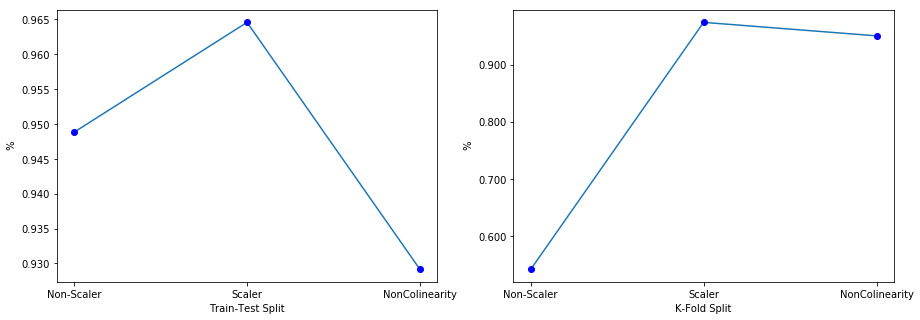

In [37]:
print('++++++++++++++++++++++++++++++++++')
print('    Accuracy Comparison        ')
print('++++++++++++++++++++++++++++++++++')

Compare = [[Accuracy_Score.mean(),ZAccuracy_Score.mean(),Uncorr_ZAccuracy_Score.mean()],
           [results2.mean(),results3K.mean(),results1.mean()]]

Compare1_Models = pd.DataFrame(Compare, columns= ['Non-Scaler','Scaler','NonColinearity'], 
                                  index=['Train-Test Split','K-Fold'])
print(Compare1_Models)


Compare1A = [[Accuracy_Score.mean()],[ZAccuracy_Score.mean()],[Uncorr_ZAccuracy_Score.mean()]]
Compare1A_Models = pd.DataFrame(Compare1A, columns= ['Accuracy'], 
                                  index=['Non-Scaler','Scaler','NonColinearity'])

Compare1B = [[results2.mean()],[results3K.mean()],[results1.mean()]]
Compare1B_Models = pd.DataFrame(Compare1B, columns= ['Accuracy'], 
                                  index=['Non-Scaler','Scaler','NonColinearity'])

valuesA = [Accuracy_Score.mean(),ZAccuracy_Score.mean(),Uncorr_ZAccuracy_Score.mean()]
valuesB = [[results2.mean()],[results3K.mean()],[results1.mean()]]

fig, ax = plt.subplots(1,2, figsize = (15,5))
#ax[0].plot(Compare1A_Models.index.values, Compare1A_Models['Accuracy'])
ax[0].plot(Compare1A_Models.index.values, Compare1A_Models['Accuracy'],valuesA, 'bo')
ax[0].set_xlabel('Train-Test Split')
ax[0].set_ylabel(' %')
##ax[0].legend()
ax[1].plot(Compare1B_Models.index.values, Compare1B_Models['Accuracy'],valuesB, 'bo')
ax[1].yaxis.set_major_formatter(FormatStrFormatter('%.3f'))
ax[1].set_xlabel('K-Fold Split') 
ax[1].set_ylabel(' %')
##ax[1].legend()
plt.show()

## PCA : Principal Components Analysis on ZX with n_components = 3, 6, 7, 10, 12 & 18


In [38]:
ZX.columns

Index(['compactness', 'circularity', 'distance_circularity', 'radius_ratio',
       'pr.axis_aspect_ratio', 'max.length_aspect_ratio', 'scatter_ratio',
       'elongatedness', 'pr.axis_rectangularity', 'max.length_rectangularity',
       'scaled_variance', 'scaled_variance.1', 'scaled_radius_of_gyration',
       'scaled_radius_of_gyration.1', 'skewness_about', 'skewness_about.1',
       'skewness_about.2', 'hollows_ratio'],
      dtype='object')

In [39]:
ZX.shape

(846, 18)

In [40]:
ZX.head()

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio
0,0.160580,0.518073,0.057177,0.273363,1.310398,0.311542,-0.207598,0.136262,-0.224342,0.758332,-0.401920,-0.341934,0.285705,-0.327326,-0.073812,0.380870,-0.312012,0.183957
1,-0.325470,-0.623732,0.120741,-0.835032,-0.593753,0.094079,-0.599423,0.520519,-0.610886,-0.344578,-0.593357,-0.619724,-0.513630,-0.059384,0.538390,0.156798,0.013265,0.452977
2,1.254193,0.844303,1.519141,1.202018,0.548738,0.311542,1.148719,-1.144597,0.935290,0.689401,1.097671,1.109379,1.392477,0.074587,1.558727,-0.403383,-0.149374,0.049447
3,-0.082445,-0.623732,-0.006386,-0.295813,0.167907,0.094079,-0.750125,0.648605,-0.610886,-0.344578,-0.912419,-0.738777,-1.466683,-1.265121,-0.073812,-0.291347,1.639649,1.529056
4,-1.054545,-0.134387,-0.769150,1.082192,5.245643,9.444962,-0.599423,0.520519,-0.610886,-0.275646,1.671982,-0.648070,0.408680,7.309005,0.538390,-0.179311,-1.450481,-1.699181


In [41]:
X.head()

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio
0,95,48.0,83.0,178.0,72.0,10,162.0,42.0,20.0,159,176.0,379.0,184.0,70.0,6.0,16.0,187.0,197
1,91,41.0,84.0,141.0,57.0,9,149.0,45.0,19.0,143,170.0,330.0,158.0,72.0,9.0,14.0,189.0,199
2,104,50.0,106.0,209.0,66.0,10,207.0,32.0,23.0,158,223.0,635.0,220.0,73.0,14.0,9.0,188.0,196
3,93,41.0,82.0,159.0,63.0,9,144.0,46.0,19.0,143,160.0,309.0,127.0,63.0,6.0,10.0,199.0,207
4,85,44.0,70.0,205.0,103.0,52,149.0,45.0,19.0,144,241.0,325.0,188.0,127.0,9.0,11.0,180.0,183


In [42]:
pca3 = PCA(n_components=3)
pca3.fit(ZX)
Xpca3 = pca3.transform(ZX)

pca6 = PCA(n_components=6)
pca6.fit(ZX)
Xpca6 = pca6.transform(ZX)
Xpca6

pca7 = PCA(n_components=7)
pca7.fit(ZX)
Xpca7 = pca7.transform(ZX)

pca10 = PCA(n_components=10)
pca10.fit(ZX)
Xpca10 = pca10.transform(ZX)

pca12 = PCA(n_components=12)
pca12.fit(ZX)
Xpca12 = pca12.transform(ZX)

pca18 = PCA(n_components=18)
pca18.fit(ZX)
Xpca18 = pca18.transform(ZX)


## Lets PairPlot all PCAs : Xpca3, Xpca6, Xpca7, Xpca10, Xpca12 & Xpca18

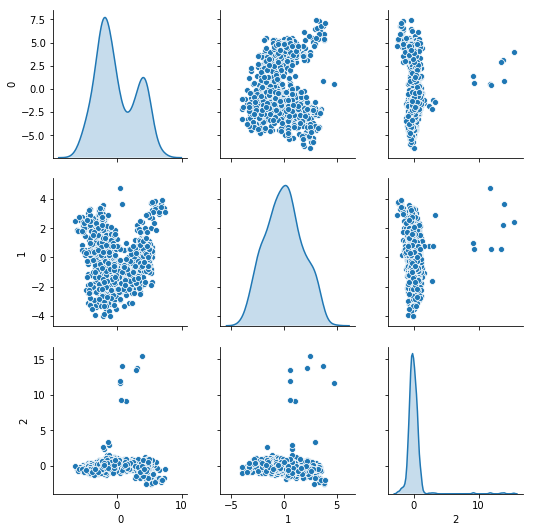

In [43]:
sns.pairplot(pd.DataFrame(Xpca3),diag_kind='kde')

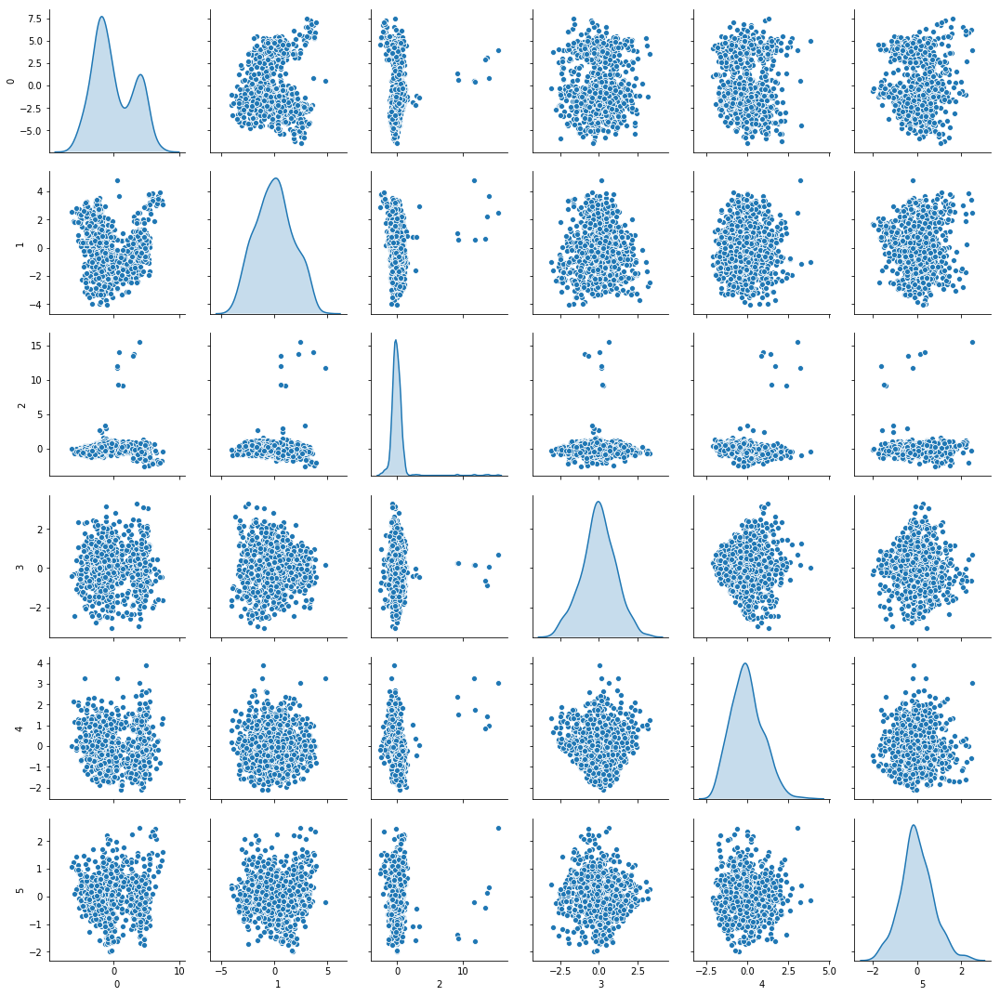

In [44]:
sns.pairplot(pd.DataFrame(Xpca6),diag_kind='kde')

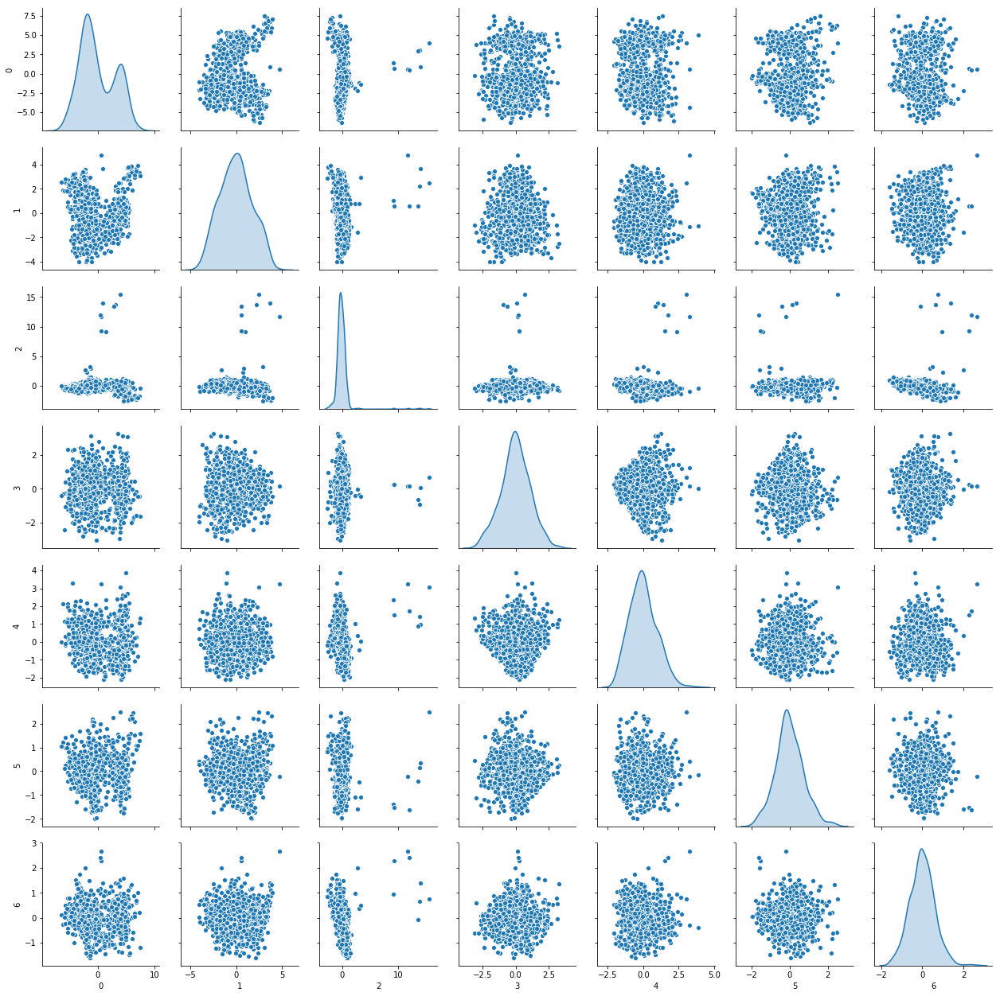

In [45]:
sns.pairplot(pd.DataFrame(Xpca7),diag_kind='kde')

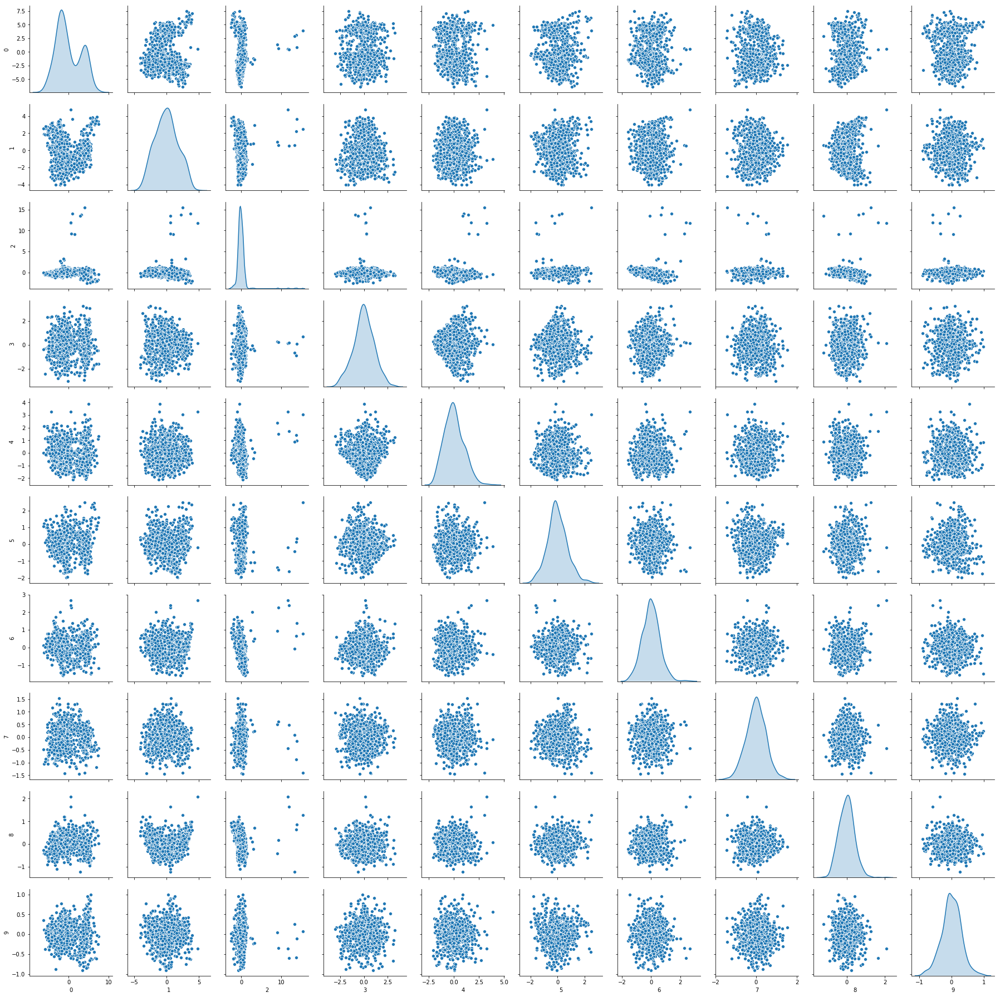

In [46]:
sns.pairplot(pd.DataFrame(Xpca10),diag_kind='kde')

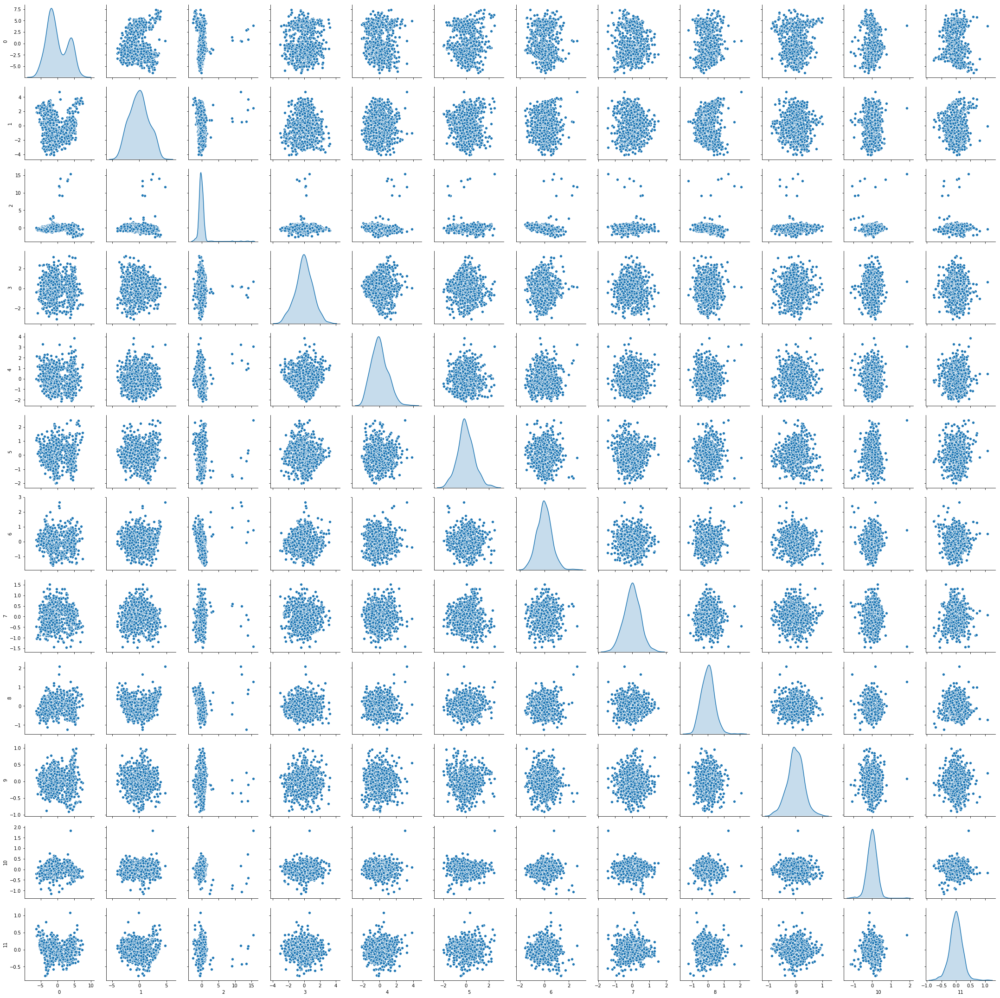

In [47]:
sns.pairplot(pd.DataFrame(Xpca12),diag_kind='kde')

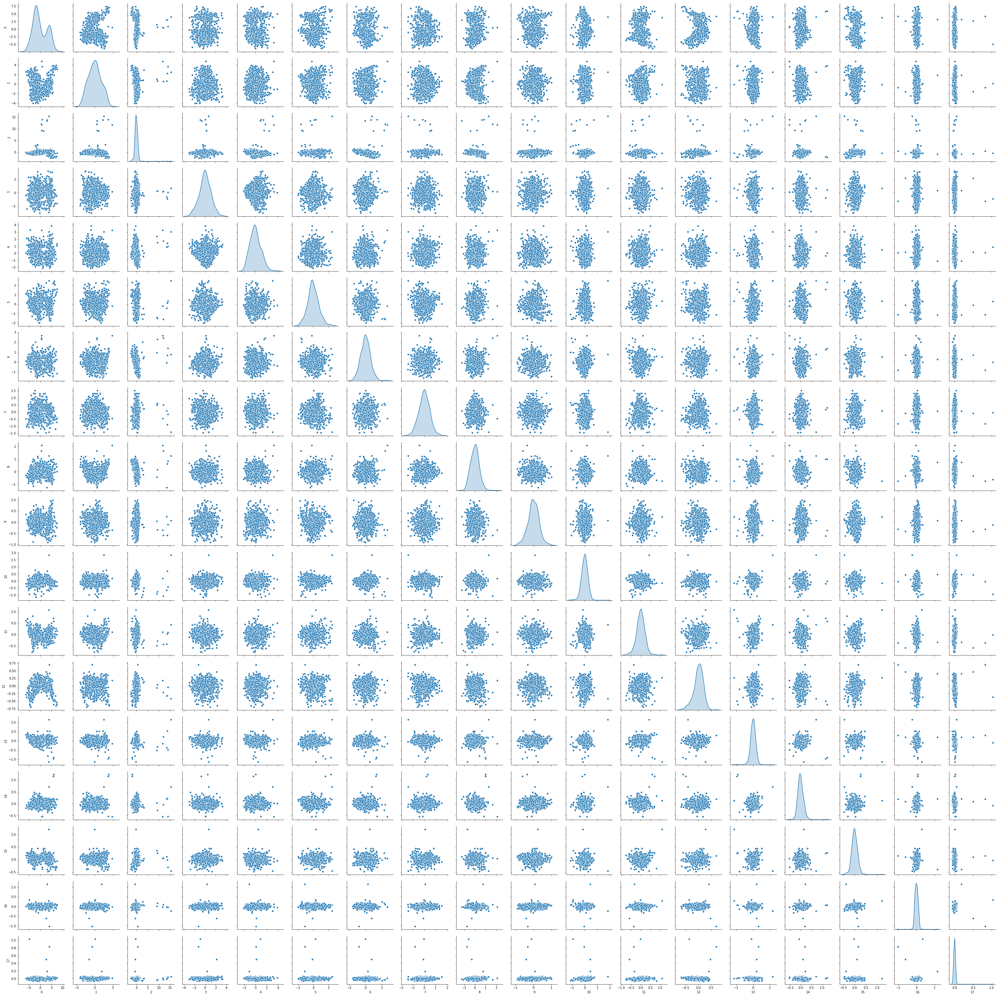

In [48]:
sns.pairplot(pd.DataFrame(Xpca18),diag_kind='kde')

## Percentage of Variance explained by each of the selected components.

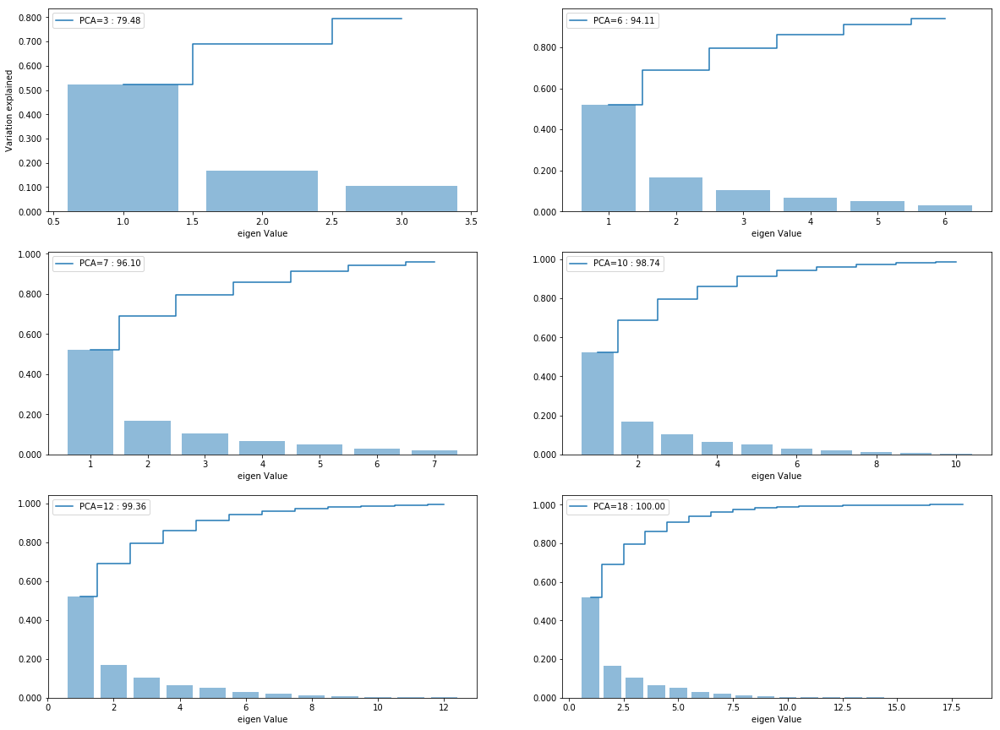

In [49]:
sumPCA3=np.sum(pca3.explained_variance_ratio_)
sumPCA6=np.sum(pca6.explained_variance_ratio_)
sumPCA7=np.sum(pca7.explained_variance_ratio_)
sumPCA10=np.sum(pca10.explained_variance_ratio_)
sumPCA12=np.sum(pca12.explained_variance_ratio_)
sumPCA18=np.sum(pca18.explained_variance_ratio_)


fig, ax = plt.subplots(3,2, figsize = (20,15))
ax[0,0].bar(list(range(1,4)),pca3.explained_variance_ratio_,alpha=0.5, align='center')
ax[0,0].step(list(range(1,4)),np.cumsum(pca3.explained_variance_ratio_), where='mid',label='PCA=3 : %.2f'%(sumPCA3*100))
ax[0,0].set_xlabel('eigen Value')
ax[0,0].set_ylabel('Variation explained')
ax[0,0].legend()
ax[0,0].yaxis.set_major_formatter(FormatStrFormatter('%.3f'))

ax[0,1].bar(list(range(1,7)),pca6.explained_variance_ratio_,alpha=0.5, align='center')
ax[0,1].step(list(range(1,7)),np.cumsum(pca6.explained_variance_ratio_), where='mid',label='PCA=6 : %.2f'%(sumPCA6*100))
ax[0,1].set_xlabel('eigen Value')
ax[0,1].legend()
ax[0,1].yaxis.set_major_formatter(FormatStrFormatter('%.3f'))

ax[1,0].bar(list(range(1,8)),pca7.explained_variance_ratio_,alpha=0.5, align='center')
ax[1,0].step(list(range(1,8)),np.cumsum(pca7.explained_variance_ratio_), where='mid',label='PCA=7 : %.2f'%(sumPCA7*100))
ax[1,0].set_xlabel('eigen Value')
#ax[2].set_ylabel('Variation explained')
ax[1,0].yaxis.set_major_formatter(FormatStrFormatter('%.3f'))
ax[1,0].legend()

ax[1,1].bar(list(range(1,11)),pca10.explained_variance_ratio_,alpha=0.5, align='center')
ax[1,1].step(list(range(1,11)),np.cumsum(pca10.explained_variance_ratio_), where='mid',label='PCA=10 : %.2f'%(sumPCA10*100))
ax[1,1].set_xlabel('eigen Value')
ax[1,1].yaxis.set_major_formatter(FormatStrFormatter('%.3f'))
ax[1,1].legend()

ax[2,0].bar(list(range(1,13)),pca12.explained_variance_ratio_,alpha=0.5, align='center')
ax[2,0].step(list(range(1,13)),np.cumsum(pca12.explained_variance_ratio_), where='mid',label='PCA=12 : %.2f'%(sumPCA12*100))
ax[2,0].set_xlabel('eigen Value')
#ax[2].set_ylabel('Variation explained')
ax[2,0].yaxis.set_major_formatter(FormatStrFormatter('%.3f'))
ax[2,0].legend()

ax[2,1].bar(list(range(1,19)),pca18.explained_variance_ratio_,alpha=0.5, align='center')
ax[2,1].step(list(range(1,19)),np.cumsum(pca18.explained_variance_ratio_), where='mid',label='PCA=18 : %.2f'%(sumPCA18*100))
ax[2,1].set_xlabel('eigen Value')
#ax[2].set_ylabel('Variation explained')
ax[2,1].yaxis.set_major_formatter(FormatStrFormatter('%.3f'))
ax[2,1].legend()
plt.show()


In [50]:
print("original shape:   ", ZX.shape)
print("transformed shape:", Xpca3.shape)

original shape:    (846, 18)
transformed shape: (846, 3)


In [51]:
print("original shape:   ", ZX.shape)
print("transformed shape:", Xpca6.shape)

original shape:    (846, 18)
transformed shape: (846, 6)


In [52]:
print("original shape:   ", ZX.shape)
print("transformed shape:", Xpca7.shape)

original shape:    (846, 18)
transformed shape: (846, 7)


In [53]:
print("original shape:   ", ZX.shape)
print("transformed shape:", Xpca10.shape)

original shape:    (846, 18)
transformed shape: (846, 10)


In [54]:
print("original shape:   ", ZX.shape)
print("transformed shape:", Xpca12.shape)

original shape:    (846, 18)
transformed shape: (846, 12)


In [55]:
print("original shape:   ", ZX.shape)
print("transformed shape:", Xpca18.shape)

original shape:    (846, 18)
transformed shape: (846, 18)


## TRAIN-TEST split on PCA Components

In [56]:
ZX6_train, ZX6_test,y_train,y_test = train_test_split(Xpca6, y, test_size=.30, random_state=my_random_seed)
ZX7_train, ZX7_test,y_train,y_test = train_test_split(Xpca7, y, test_size=.30, random_state=my_random_seed)
ZX3_train, ZX3_test,y_train,y_test = train_test_split(Xpca3, y, test_size=.30, random_state=my_random_seed)
ZX10_train, ZX10_test,y_train,y_test = train_test_split(Xpca10, y, test_size=.30, random_state=my_random_seed)
ZX12_train, ZX12_test,y_train,y_test = train_test_split(Xpca12, y, test_size=.30, random_state=my_random_seed)
ZX18_train, ZX18_test,y_train,y_test = train_test_split(Xpca18, y, test_size=.30, random_state=my_random_seed)


In [57]:
ZX6_test.shape

(254, 6)

In [58]:
ZX7_train.shape

(592, 7)

In [59]:
y_train.shape

(592,)

In [60]:
y.shape

(846,)

### Use PCA from Scikit learn, extract Principal Components that capture about 95% of the variance in the data

In [61]:
svclassifier6 = SVC(kernel='linear')
svclassifier6.fit(ZX6_train, y_train) 
y_pred6 = svclassifier6.predict(ZX6_test)

svclassifier7 = SVC(kernel='linear')
svclassifier7.fit(ZX7_train, y_train) 
y_pred7 = svclassifier7.predict(ZX7_test)

svclassifier3 = SVC(kernel='linear')
svclassifier3.fit(ZX3_train, y_train) 
y_pred3 = svclassifier3.predict(ZX3_test)

svclassifier10 = SVC(kernel='linear')
svclassifier10.fit(ZX10_train, y_train) 
y_pred10 = svclassifier10.predict(ZX10_test)

svclassifier12 = SVC(kernel='linear')
svclassifier12.fit(ZX12_train, y_train) 
y_pred12 = svclassifier12.predict(ZX12_test)

svclassifier18 = SVC(kernel='linear')
svclassifier18.fit(ZX18_train, y_train) 
y_pred18 = svclassifier18.predict(ZX18_test)

print(confusion_matrix(y_test,y_pred6))
print(classification_report(y_test,y_pred6))

Accuracy_Score6 = accuracy_score(y_test, y_pred6)
Precision_Score6 = precision_score(y_test, y_pred6,  average="macro")
Recall_Score6 = recall_score(y_test, y_pred6,  average="macro")
F1_Score6 = f1_score(y_test, y_pred6,  average="macro")


Accuracy_Score7 = accuracy_score(y_test, y_pred7)
Precision_Score7 = precision_score(y_test, y_pred7,  average="macro")
Recall_Score7 = recall_score(y_test, y_pred7,  average="macro")
F1_Score7 = f1_score(y_test, y_pred7,  average="macro")

Accuracy_Score3 = accuracy_score(y_test, y_pred3)
Precision_Score3 = precision_score(y_test, y_pred3,  average="macro")
Recall_Score3 = recall_score(y_test, y_pred3,  average="macro")
F1_Score3 = f1_score(y_test, y_pred3,  average="macro")

Accuracy_Score10 = accuracy_score(y_test, y_pred10)
Precision_Score10 = precision_score(y_test, y_pred10,  average="macro")
Recall_Score10 = recall_score(y_test, y_pred10,  average="macro")
F1_Score10 = f1_score(y_test, y_pred10,  average="macro")

Accuracy_Score12 = accuracy_score(y_test, y_pred12)
Precision_Score12 = precision_score(y_test, y_pred12,  average="macro")
Recall_Score12 = recall_score(y_test, y_pred12,  average="macro")
F1_Score12 = f1_score(y_test, y_pred12,  average="macro")

Accuracy_Score18= accuracy_score(y_test, y_pred18)
Precision_Score18 = precision_score(y_test, y_pred18,  average="macro")
Recall_Score18 = recall_score(y_test, y_pred18,  average="macro")
F1_Score18 = f1_score(y_test, y_pred18,  average="macro")

print(confusion_matrix(y_test,y_pred12))

[[52 12  7]
 [18 96 11]
 [ 3  3 52]]
              precision    recall  f1-score   support

         bus       0.71      0.73      0.72        71
         car       0.86      0.77      0.81       125
         van       0.74      0.90      0.81        58

   micro avg       0.79      0.79      0.79       254
   macro avg       0.77      0.80      0.78       254
weighted avg       0.79      0.79      0.79       254

[[ 65   4   2]
 [  2 119   4]
 [  1   0  57]]


## K-Fold split & Cross Validation score on PCA Components : Xpca3,Xpca6,Xpca7,Xpca10,Xpca12 & Xpca18

In [62]:
kfold = model_selection.KFold(n_splits=10, random_state=my_random_seed)
clf6 = SVC(gamma=0.025, C=3) 
clf7 = SVC(gamma=0.025, C=3) 
clf3 = SVC(gamma=0.025, C=3) 
clf10 = SVC(gamma=0.025, C=3) 
clf12 = SVC(gamma=0.025, C=3) 
clf18 = SVC(gamma=0.025, C=3) 

results6= model_selection.cross_val_score(clf6,Xpca6, y, cv=kfold)
results7 = model_selection.cross_val_score(clf7,Xpca7, y, cv=kfold)
results3= model_selection.cross_val_score(clf3,Xpca3, y, cv=kfold)
results10 = model_selection.cross_val_score(clf10,Xpca10, y, cv=kfold)
results12 = model_selection.cross_val_score(clf10,Xpca12, y, cv=kfold)
results18 = model_selection.cross_val_score(clf10,Xpca18, y, cv=kfold)


## Compiling all Accuracies calculated so far 

+++++++++++++++++++++++++++++++
    FINAL ACCURACY SCORE      
+++++++++++++++++++++++++++++++
                              Train-Test     K-Fold PCA Explained_var_ratio_
PCA=3                          64.173228  73.175070                  79.4784
PCA=6                          78.740157  86.760504                  94.1122
PCA=7                          82.283465  92.546218                  96.1035
PCA=10                         89.763780  95.626050                   98.736
PCA=12                         94.881890  96.927171                  99.3636
PCA=18                         96.456693  97.399160                      100
(RAW) SCALER                   96.456693  97.399160                      n/a
(RAW) Non-SCALER               94.881890  54.156863                      n/a
(RAW) SCALER Non-COLINEARITY   92.913386  95.036415                      n/a
  


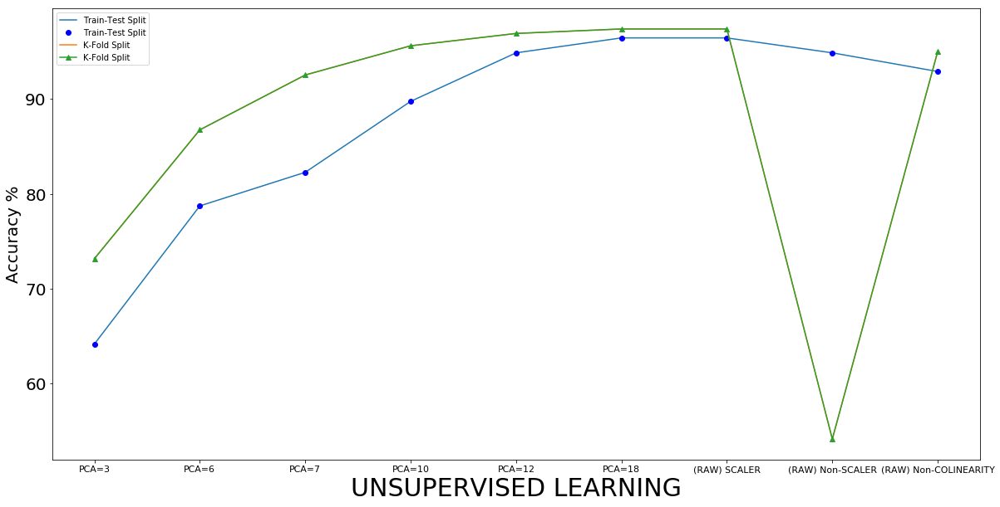

In [63]:
varPCA3=np.sum(pca3.explained_variance_ratio_)
varPCA6=np.sum(pca6.explained_variance_ratio_)
varPCA7=np.sum(pca7.explained_variance_ratio_)
varPCA10=np.sum(pca10.explained_variance_ratio_)
varPCA12=np.sum(pca12.explained_variance_ratio_)
varPCA18=np.sum(pca18.explained_variance_ratio_)


Compare10 = [[(Accuracy_Score3.mean()*100),(results3.mean()*100),(varPCA3*100)],
            [(Accuracy_Score6.mean()*100),(results6.mean()*100),(varPCA6*100)],
            [(Accuracy_Score7.mean()*100),(results7.mean()*100),(varPCA7*100)],
            [(Accuracy_Score10.mean()*100),(results10.mean()*100),(varPCA10*100)],
            [(Accuracy_Score12.mean()*100),(results12.mean()*100),(varPCA12*100)],
            [(Accuracy_Score18.mean()*100),(results18.mean()*100),(varPCA18*100)],
            [(ZAccuracy_Score.mean()*100),(results3K.mean()*100),'n/a'],
            [(Accuracy_Score.mean()*100),(results2.mean()*100),'n/a'],
            [(Uncorr_ZAccuracy_Score.mean()*100),(results1.mean()*100),'n/a']
           ]

Compare10_Models = pd.DataFrame(Compare10, columns= ['Train-Test','K-Fold','PCA Explained_var_ratio_'], 
                                  index=['PCA=3','PCA=6','PCA=7','PCA=10','PCA=12','PCA=18','(RAW) SCALER',
                                         '(RAW) Non-SCALER','(RAW) SCALER Non-COLINEARITY'])

Compare1A =[[(Accuracy_Score3.mean()*100)],
            [(Accuracy_Score6.mean()*100)],
            [(Accuracy_Score7.mean()*100)],
            [(Accuracy_Score10.mean()*100)],
            [(Accuracy_Score12.mean()*100)],
            [(Accuracy_Score18.mean()*100)],
            [(ZAccuracy_Score.mean()*100)],
            [(Accuracy_Score.mean()*100)],
            [(Uncorr_ZAccuracy_Score.mean()*100)]
          ]

Compare1B =[[(results3.mean()*100)],
            [(results6.mean()*100)],
            [(results7.mean()*100)],
            [(results10.mean()*100)],
            [(results12.mean()*100)],
            [(results18.mean()*100)],
            [(results3K.mean()*100)],
            [(results2.mean()*100)],
            [(results1.mean()*100)]
          ]

values1A = [(Accuracy_Score3.mean()*100),(Accuracy_Score6.mean()*100),(Accuracy_Score7.mean()*100),
            (Accuracy_Score10.mean()*100),(Accuracy_Score12.mean()*100),(Accuracy_Score18.mean()*100),
            (ZAccuracy_Score.mean()*100),(Accuracy_Score.mean()*100),
            (Uncorr_ZAccuracy_Score.mean()*100)]

values1B = [(results3.mean()*100),(results6.mean()*100),(results7.mean()*100),(results10.mean()*100),
            (results12.mean()*100),(results18.mean()*100),
            (results3K.mean()*100),(results2.mean()*100),(results1.mean()*100)]

Compare1A_Models = pd.DataFrame(Compare1A, columns= ['Train-Test Split'], 
                                  index=['PCA=3','PCA=6','PCA=7','PCA=10','PCA=12','PCA=18','(RAW) SCALER',
                                         '(RAW) Non-SCALER','(RAW) Non-COLINEARITY'])

Compare1B_Models = pd.DataFrame(Compare1B, columns= ['K-Fold Split'], 
                                  index=['PCA=3','PCA=6','PCA=7','PCA=10','PCA=12','PCA=18','(RAW) SCALER',
                                         '(RAW) Non-SCALER','(RAW) Non-COLINEARITY'])




print('+++++++++++++++++++++++++++++++')
print('    FINAL ACCURACY SCORE      ')
print('+++++++++++++++++++++++++++++++')

print(Compare10_Models) 
print('  ')
fig, ax = plt.subplots(1,1, figsize = (20,10))
ax.plot(Compare1A_Models.index.values, Compare1A_Models['Train-Test Split'],values1A,'bo')
ax.plot(Compare1B_Models.index.values, Compare1B_Models['K-Fold Split'],values1B,'-^')
ax.set_xlabel('UNSUPERVISED LEARNING', size=30)
ax.set_ylabel('Accuracy %',size=20)
ax.tick_params(axis="x", labelsize=11)
ax.tick_params(axis="y", labelsize=20)
ax.legend()
plt.show()

### (Project Task) Compare the accuracy scores and cross validation scores of Support vector machines – one trained using raw data and the other using Principal Components

## (Project Conclusion) 
### Principal Components that capture about ~-+94.1122% of the variance in the data 
#### PCA=6  (Train-Test) Accuracy Score = 78.740157  AND  (K-Fold) Accuracy Score = 86.760504
#### PCA=7  (Train-Test) Accuracy Score = 82.28  AND  (K-Fold) Accuracy Score = 92.54
### (RAW)(SCALER)  (Train-Test) Accuracy Score = 96.45  AND  (K-Fold) Accuracy Score = 97.39
### (RAW)(Non-SCALER)  (Train-Test) Accuracy Score = 94.88  AND  (K-Fold) Accuracy Score = 54.15
### (RAW)(SCALER) Non-COLINEARITY (Train-Test) Accuracy Score = 92.91  AND  (K-Fold) Accuracy Score = 95.03

## "vehicle" dataset has scored max.  Accuracy ~97% using SVM algorithim on scaled data (same as PCA=18 (all features))